# Assignment 2 - Task 2

Table of Contents:

1. Import Libraries
2. Import Data
3. Exploratory Data Analysis
4. Data Preprocessing
5. Gaussian Naive Bayes
6. Gaussian Discriminant Analysis
7. Logistic Regression
8. Perceptron
9. Analysis

### 1. Import Libraries:

In [269]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression, Perceptron
from sklearn.metrics import roc_curve


### 2. Import Data:

In [270]:
# col names
columns = ['ID', 'Diagnosis', 'Radius_mean', 'Texture_mean', 'Perimeter_mean', 'Area_mean', 'Smoothness_mean',
           'Compactness_mean', 'Concavity_mean', 'Concave_points_mean', 'Symmetry_mean', 'Fractal_dimension_mean',
           'Radius_se', 'Texture_se', 'Perimeter_se', 'Area_se', 'Smoothness_se', 'Compactness_se', 'Concavity_se',
           'Concave_points_se', 'Symmetry_se', 'Fractal_dimension_se', 'Radius_worst', 'Texture_worst',
           'Perimeter_worst', 'Area_worst', 'Smoothness_worst', 'Compactness_worst', 'Concavity_worst',
           'Concave_points_worst', 'Symmetry_worst', 'Fractal_dimension_worst']

# load data
data = pd.read_csv('wdbc.data', header=None, names=columns)
data = data.drop(columns=['ID'])
data['Diagnosis'] = data['Diagnosis'].map({'M': 1, 'B': 0})

# Check the dataset we imported
print(data.shape)
data.head()


(569, 31)


,Diagnosis,Radius_mean,Texture_mean,Perimeter_mean,Area_mean,Smoothness_mean,Compactness_mean,Concavity_mean,Concave_points_mean,Symmetry_mean,...,Radius_worst,Texture_worst,Perimeter_worst,Area_worst,Smoothness_worst,Compactness_worst,Concavity_worst,Concave_points_worst,Symmetry_worst,Fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [271]:
# Check for null values
print(data.isnull().sum())

Diagnosis                  0
Radius_mean                0
Texture_mean               0
Perimeter_mean             0
Area_mean                  0
Smoothness_mean            0
Compactness_mean           0
Concavity_mean             0
Concave_points_mean        0
Symmetry_mean              0
Fractal_dimension_mean     0
Radius_se                  0
Texture_se                 0
Perimeter_se               0
Area_se                    0
Smoothness_se              0
Compactness_se             0
Concavity_se               0
Concave_points_se          0
Symmetry_se                0
Fractal_dimension_se       0
Radius_worst               0
Texture_worst              0
Perimeter_worst            0
Area_worst                 0
Smoothness_worst           0
Compactness_worst          0
Concavity_worst            0
Concave_points_worst       0
Symmetry_worst             0
Fractal_dimension_worst    0
dtype: int64


In [272]:
data.describe()
# Check the basic statistics of the dataset

,Diagnosis,Radius_mean,Texture_mean,Perimeter_mean,Area_mean,Smoothness_mean,Compactness_mean,Concavity_mean,Concave_points_mean,Symmetry_mean,...,Radius_worst,Texture_worst,Perimeter_worst,Area_worst,Smoothness_worst,Compactness_worst,Concavity_worst,Concave_points_worst,Symmetry_worst,Fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,0.372583,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,0.483918,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,0.000000,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,0.000000,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,0.000000,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,1.000000,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,1.000000,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


### 3. Exploratory Data Analysis:

In [273]:

class EDA:
    def __init__(self, data, target_column):
        """
        Initialize EDA class with a dataset and the target variable to explore and understand what the data looks like
        """
        self.data = data
        self.target_column = target_column
        self.X = self.data.drop(columns=[self.target_column])
        self.y = self.data[self.target_column]
        self.scaled_data = None
        self.remaining_columns = self.X.columns
    
    def dataset_overview(self):
        """
        Display basic info and stats
        """
        print(f"Dataset Shape: {self.data.shape}")
        print(self.data.info())
        print(self.data.describe())
        print(self.data.head())
        print(f"Missing Vals:\n{self.data.isnull().sum()}")
        print(f"Class Dist:\n{self.data[self.target_column].value_counts()}")
        
        sns.countplot(x=self.target_column, data=self.data)
        plt.title('Class Distribution')
        plt.show()

    def univariate_analysis(self, features=None):
        """
        Plot histograms of features
        """
        if features is None:
            features = self.data.columns
        
        # Plot the histograms
        self.data[features].hist(bins=30, figsize=(20, 15))
        plt.suptitle('Histograms of Features / Cols')
        plt.show()

    def boxplot_features(self, features):
        """
        Plot box plots for selected features
        """
        plt.figure(figsize=(12, 8))
        sns.boxplot(data=self.data[features])
        plt.xticks(rotation=90)
        plt.title('Boxplots of Selected Features')
        plt.show()

    def bivariate_analysis(self, feature1, feature2):
        """
        Plot a scatter plot for two features
        """
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=feature1, y=feature2, hue=self.target_column, data=self.data)
        plt.title(f'Scatter Plot of {feature1} vs {feature2}')
        plt.show()

    def boxplot_by_target(self, feature):
        """
        Create boxplots to show feature distribution
        """
        plt.figure(figsize=(10, 6))
        sns.boxplot(x=self.target_column, y=feature, data=self.data)
        plt.title(f'Boxplot of {feature} by {self.target_column}')
        plt.show()

    def correlation_matrix(self):
        """
        plot a heatmap of the correlation matrix 
        """
        plt.figure(figsize=(20, 15))
        corr_matrix = self.data.corr()
        sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
        plt.title('Correlation Matrix')
        plt.show()
        
    def check_multicollinearity(self, threshold=0.75):
        """
        Check for multicollinearity and remove correlated cols based on threshold
        """
        
        # Calc correaltion
        corr_matrix = self.data.corr().abs()
        upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
        to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > threshold)]
        
        # Drop the features from X
        self.X = self.X.drop(columns=to_drop)
        self.remaining_columns = self.X.columns 
        
        print(f"Features to drop: {to_drop}")
        return to_drop

    def pairplot(self, features=None):
        """
        Plot pairwise relationships
        """
        if features is None:
            features = self.data.columns
        
        # Get selected features
        selected_features = features.tolist() if isinstance(features, pd.Index) else features
        if self.target_column not in selected_features:
            selected_features.append(self.target_column)
        
        # plot the pair plot and color by taget
        sns.pairplot(self.data[selected_features], hue=self.target_column)
        plt.suptitle('Pair Plot of Selected Features')
        plt.show()


    def violin_plot(self, features):
        """
        Create violin plots to show the distribution
        """
        for feature in features:
            plt.figure(figsize=(10, 6))
            sns.violinplot(x=self.target_column, y=feature, data=self.data)
            plt.title(f'Violin Plot of {feature} by {self.target_column}')
            plt.show()

    def scale_data(self):
        """
        Scale the dataset features using StandardScaler
        """
        scaler = StandardScaler()
        self.scaled_data = pd.DataFrame(scaler.fit_transform(self.X), columns=self.remaining_columns)
        print(f"Scaled data sample:\n{self.scaled_data.head()}")

    def split_data(self, test_size=0.2, random_state=42):
        """
        Split the dataset into training and test sets
        """
        if self.scaled_data is None:
            print("> Error: Scale before splitting.")
            return None, None, None, None
        
        X_train, X_test, y_train, y_test = train_test_split(self.scaled_data, self.y, test_size=test_size, random_state=random_state)
        return X_train, X_test, y_train, y_test
    
    def split_data_with_pca(self, n_components, test_size=0.2, random_state=42):
        """
        Split the dataset into training and test sets using PCA
        """
        if self.scaled_data is None:
            print("> Error: Scale before split.")
            return None, None, None, None
        
        # Apply PCA to reduce dims
        pca = PCA(n_components=n_components)
        X_pca = pca.fit_transform(self.scaled_data)
        
        # Split data into train, test, and return
        X_train_pca, X_test_pca, y_train, y_test = train_test_split(X_pca, self.y, test_size=test_size, random_state=random_state)
        return X_train_pca, X_test_pca, y_train, y_test


In [274]:

columns = ['ID', 'Diagnosis', 'Radius_mean', 'Texture_mean', 'Perimeter_mean', 'Area_mean', 'Smoothness_mean',
           'Compactness_mean', 'Concavity_mean', 'Concave_points_mean', 'Symmetry_mean', 'Fractal_dimension_mean',
           'Radius_se', 'Texture_se', 'Perimeter_se', 'Area_se', 'Smoothness_se', 'Compactness_se', 'Concavity_se',
           'Concave_points_se', 'Symmetry_se', 'Fractal_dimension_se', 'Radius_worst', 'Texture_worst',
           'Perimeter_worst', 'Area_worst', 'Smoothness_worst', 'Compactness_worst', 'Concavity_worst',
           'Concave_points_worst', 'Symmetry_worst', 'Fractal_dimension_worst']

data = pd.read_csv('wdbc.data', header=None, names=columns)
data = data.drop(columns=['ID'])
data['Diagnosis'] = data['Diagnosis'].map({'M': 1, 'B': 0})


In [275]:
# init eda
eda = EDA(data, target_column='Diagnosis')


Dataset Shape: (569, 31)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Diagnosis                569 non-null    int64  
 1   Radius_mean              569 non-null    float64
 2   Texture_mean             569 non-null    float64
 3   Perimeter_mean           569 non-null    float64
 4   Area_mean                569 non-null    float64
 5   Smoothness_mean          569 non-null    float64
 6   Compactness_mean         569 non-null    float64
 7   Concavity_mean           569 non-null    float64
 8   Concave_points_mean      569 non-null    float64
 9   Symmetry_mean            569 non-null    float64
 10  Fractal_dimension_mean   569 non-null    float64
 11  Radius_se                569 non-null    float64
 12  Texture_se               569 non-null    float64
 13  Perimeter_se             569 non-null    float64
 14  A

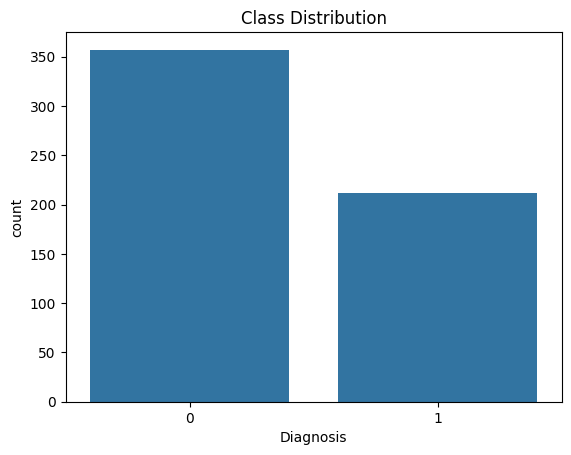

In [276]:
# Overview of dataset. This shows us that there is a slight imbalance, but since we are talking about diagnosis, I will make the assumption that this distribution is a true representation of real-life, and I will actively not rebalance it.
eda.dataset_overview()


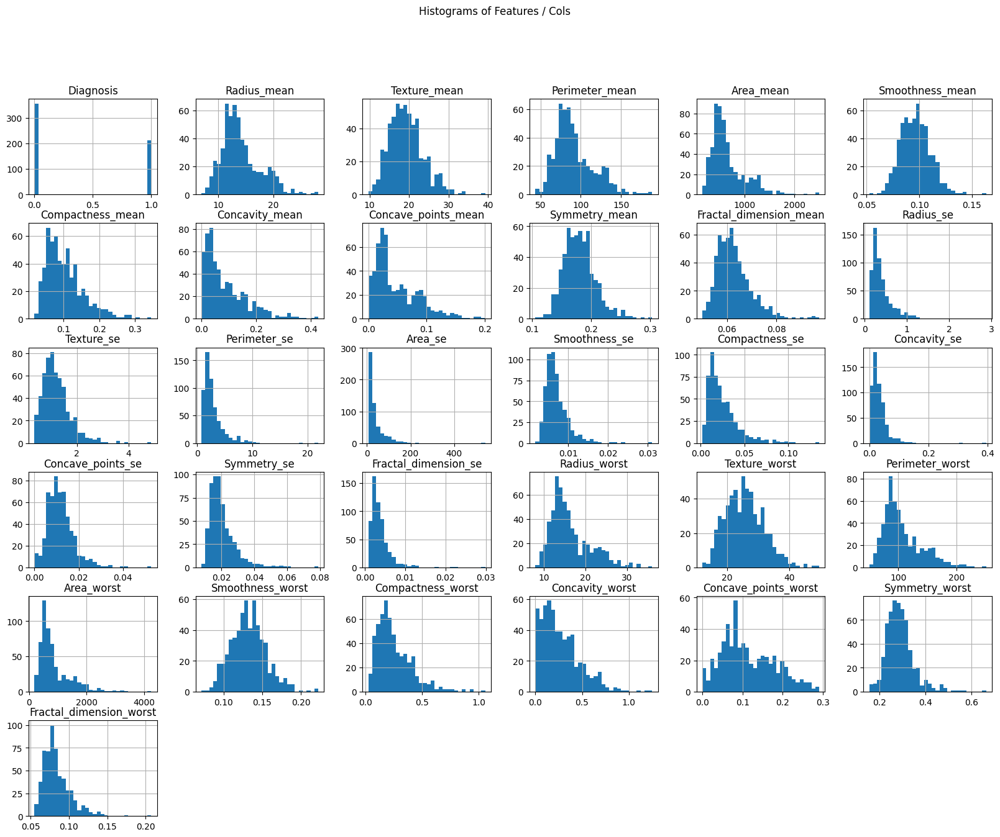

In [277]:
# We see a good distribution of data within the features. We will need to scale them to ensure the models can appropriately converge.
eda.univariate_analysis()


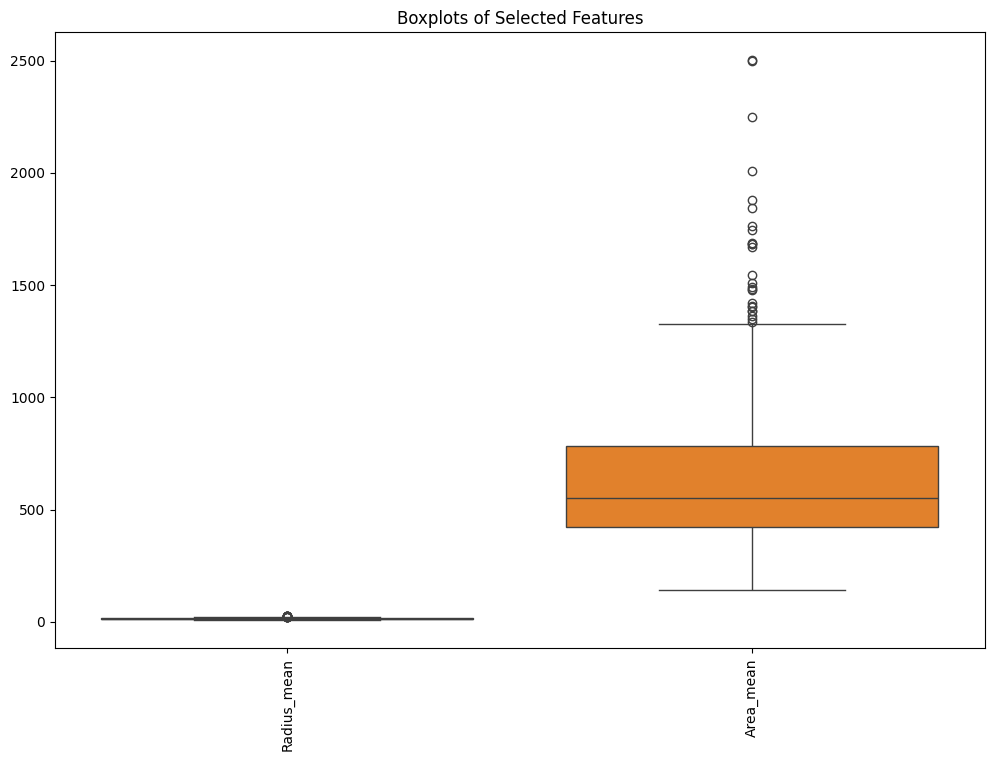

In [278]:
# Boxplots show the difference in distributions of the features
eda.boxplot_features(['Radius_mean', 'Area_mean'])


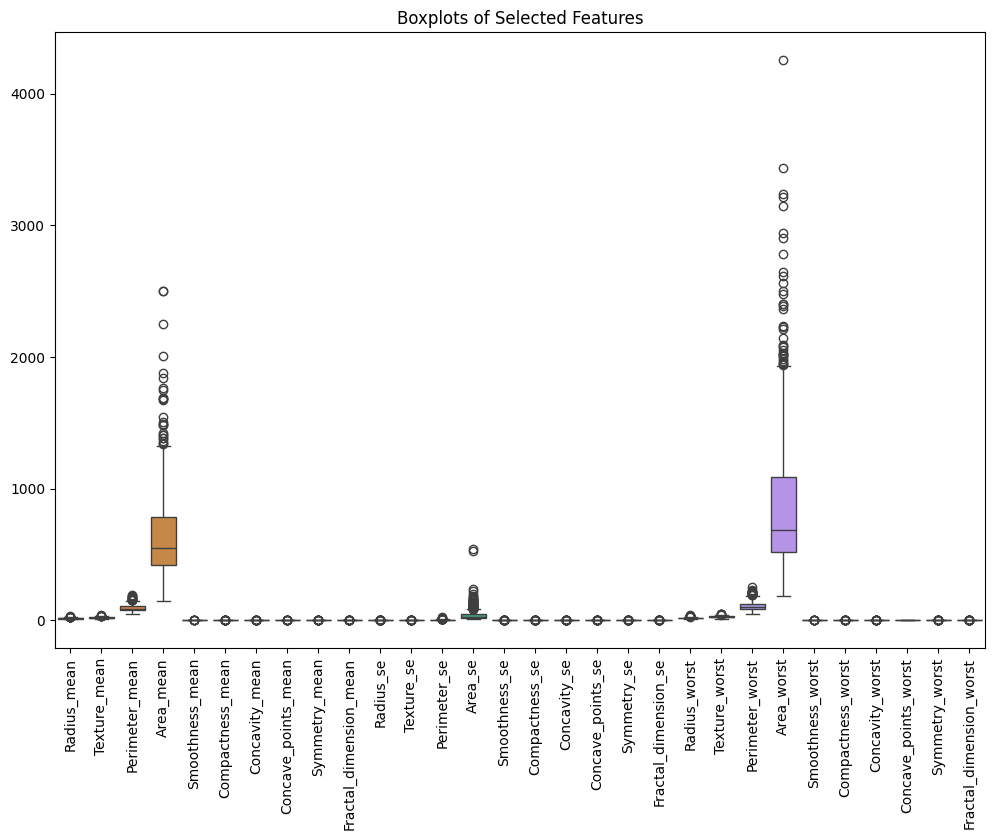

In [279]:
eda.boxplot_features(['Radius_mean', 'Texture_mean', 'Perimeter_mean', 'Area_mean', 'Smoothness_mean',
           'Compactness_mean', 'Concavity_mean', 'Concave_points_mean', 'Symmetry_mean', 'Fractal_dimension_mean',
           'Radius_se', 'Texture_se', 'Perimeter_se', 'Area_se', 'Smoothness_se', 'Compactness_se', 'Concavity_se',
           'Concave_points_se', 'Symmetry_se', 'Fractal_dimension_se', 'Radius_worst', 'Texture_worst',
           'Perimeter_worst', 'Area_worst', 'Smoothness_worst', 'Compactness_worst', 'Concavity_worst',
           'Concave_points_worst', 'Symmetry_worst', 'Fractal_dimension_worst'])


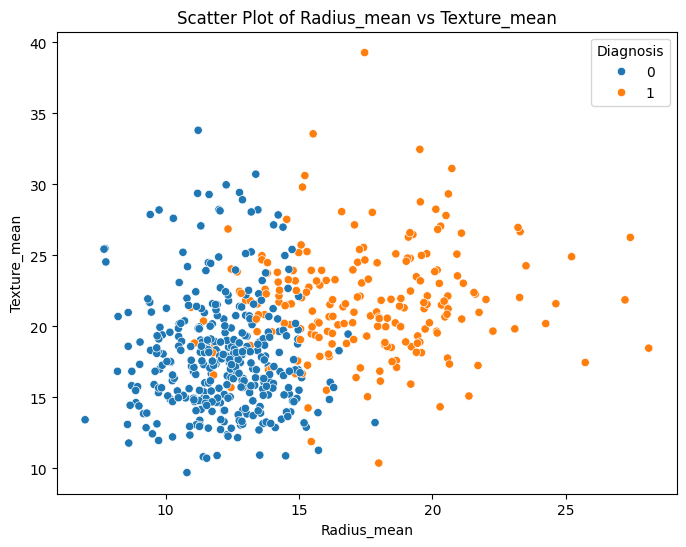

In [280]:
# Shows us good separation between malignant and benign using only two features.
# Can tentatively be linearly separable
eda.bivariate_analysis('Radius_mean', 'Texture_mean')


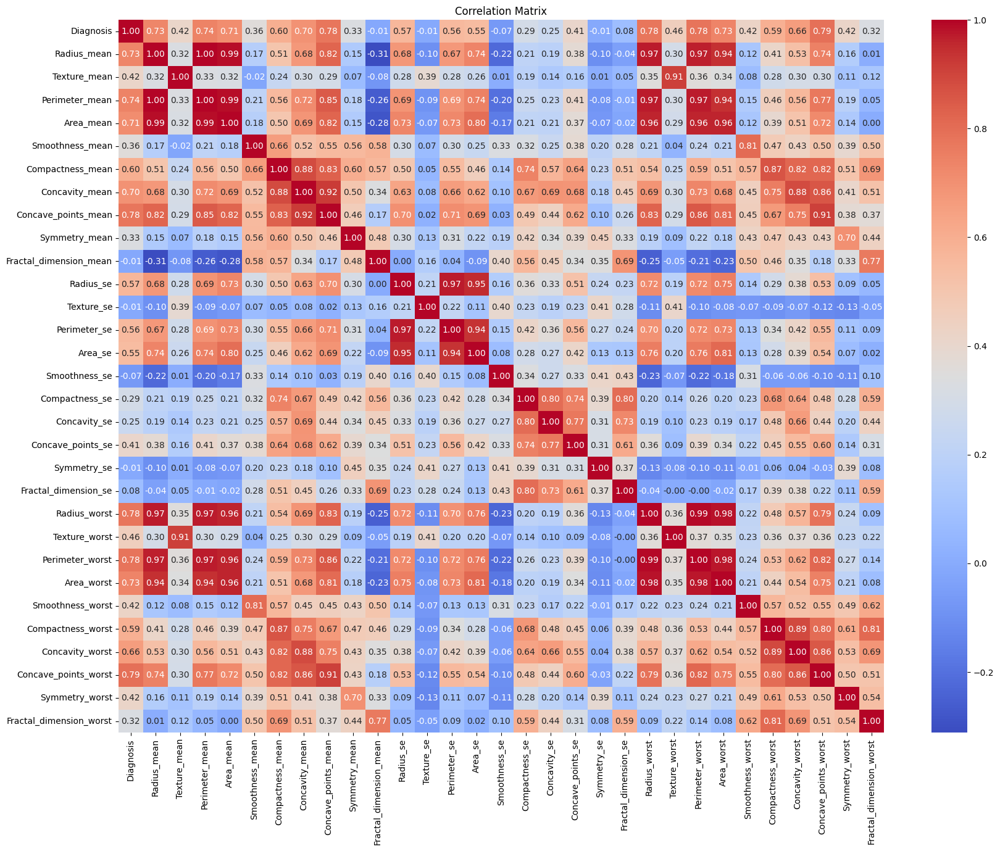

In [281]:
# Some strong correlation across some features
# Most seem to be not correlated
# We will need to address multicollinearity

eda.correlation_matrix()


In [282]:
# Craete the EDA object
eda = EDA(data, target_column='Diagnosis')

# Remove corrleated features via threshold
eda.check_multicollinearity(threshold=0.75)


Features to drop: ['Perimeter_mean', 'Area_mean', 'Concavity_mean', 'Concave_points_mean', 'Perimeter_se', 'Area_se', 'Concavity_se', 'Concave_points_se', 'Fractal_dimension_se', 'Radius_worst', 'Texture_worst', 'Perimeter_worst', 'Area_worst', 'Smoothness_worst', 'Compactness_worst', 'Concavity_worst', 'Concave_points_worst', 'Fractal_dimension_worst']


['Perimeter_mean',
 'Area_mean',
 'Concavity_mean',
 'Concave_points_mean',
 'Perimeter_se',
 'Area_se',
 'Concavity_se',
 'Concave_points_se',
 'Fractal_dimension_se',
 'Radius_worst',
 'Texture_worst',
 'Perimeter_worst',
 'Area_worst',
 'Smoothness_worst',
 'Compactness_worst',
 'Concavity_worst',
 'Concave_points_worst',
 'Fractal_dimension_worst']

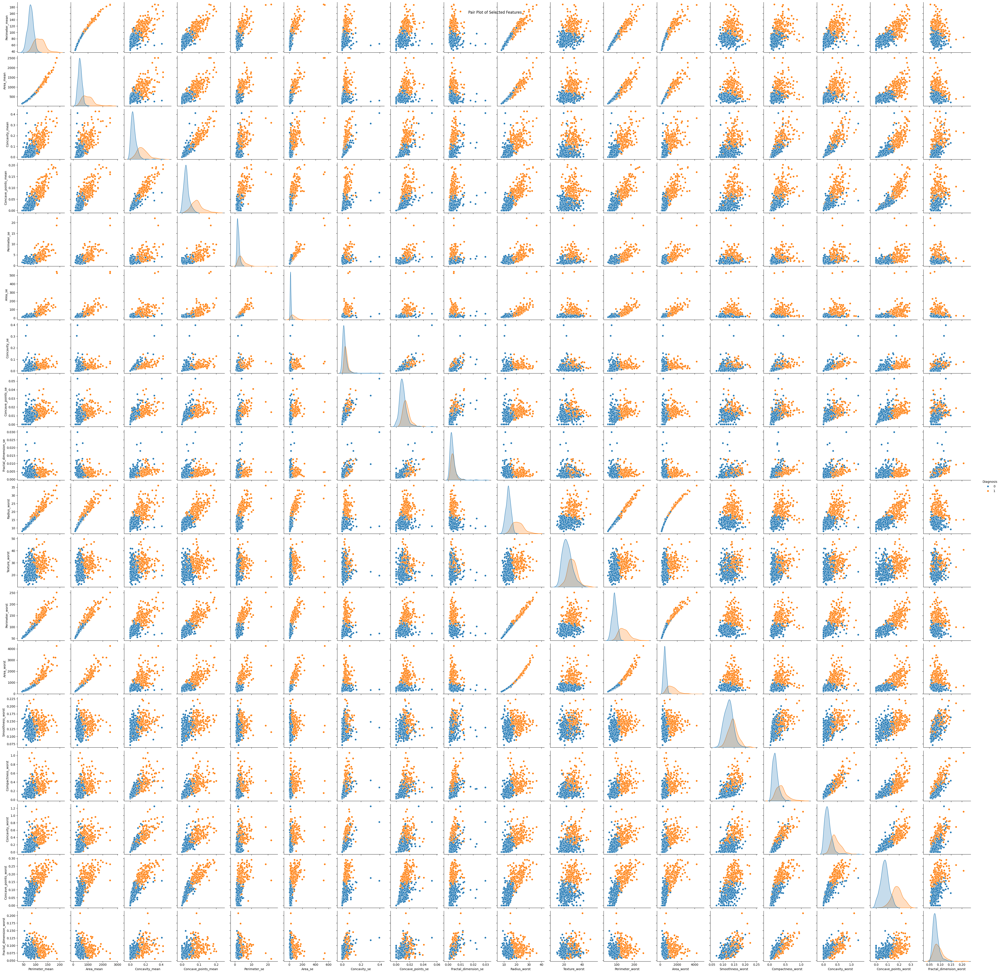

In [180]:
# Check for separation across multiple features
eda.pairplot(['Perimeter_mean',
 'Area_mean',
 'Concavity_mean',
 'Concave_points_mean',
 'Perimeter_se',
 'Area_se',
 'Concavity_se',
 'Concave_points_se',
 'Fractal_dimension_se',
 'Radius_worst',
 'Texture_worst',
 'Perimeter_worst',
 'Area_worst',
 'Smoothness_worst',
 'Compactness_worst',
 'Concavity_worst',
 'Concave_points_worst',
 'Fractal_dimension_worst'])


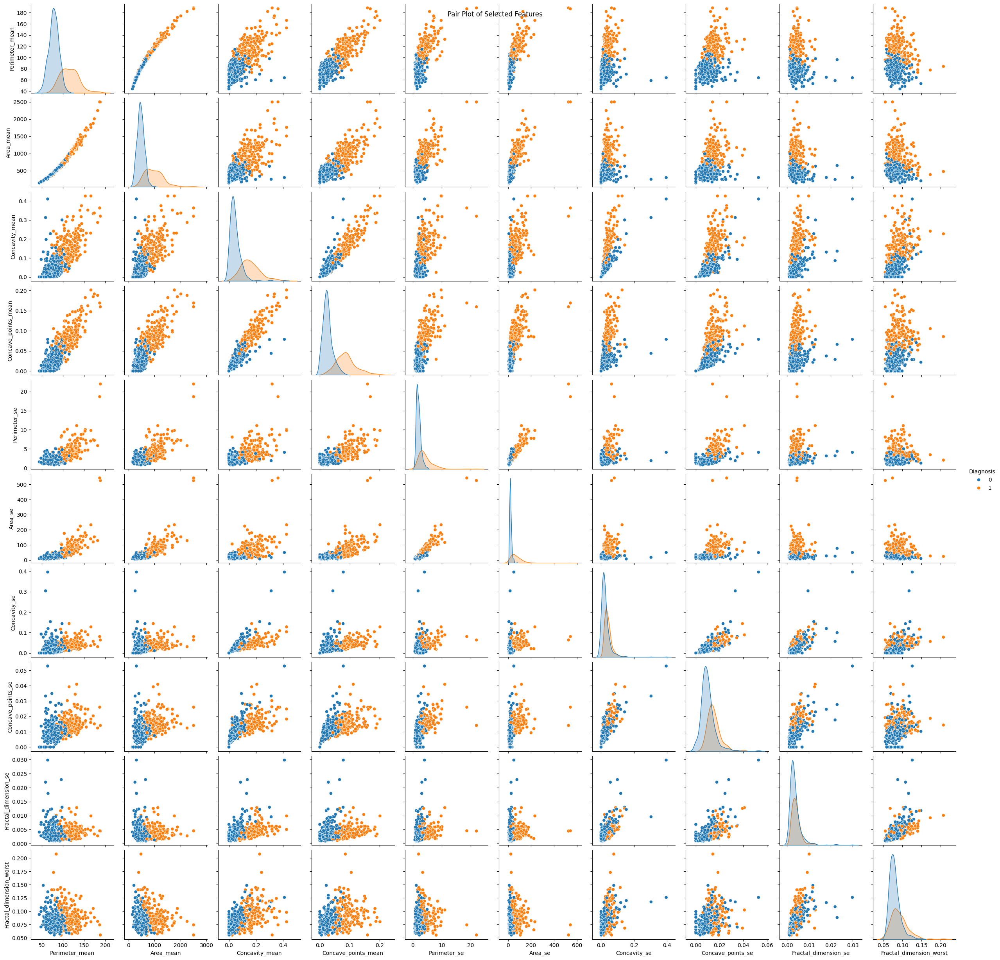

In [181]:
# Check for separation across multiple features

eda.pairplot(['Perimeter_mean',
 'Area_mean',
 'Concavity_mean',
 'Concave_points_mean',
 'Perimeter_se',
 'Area_se',
 'Concavity_se',
 'Concave_points_se',
 'Fractal_dimension_se',
 'Fractal_dimension_worst'])


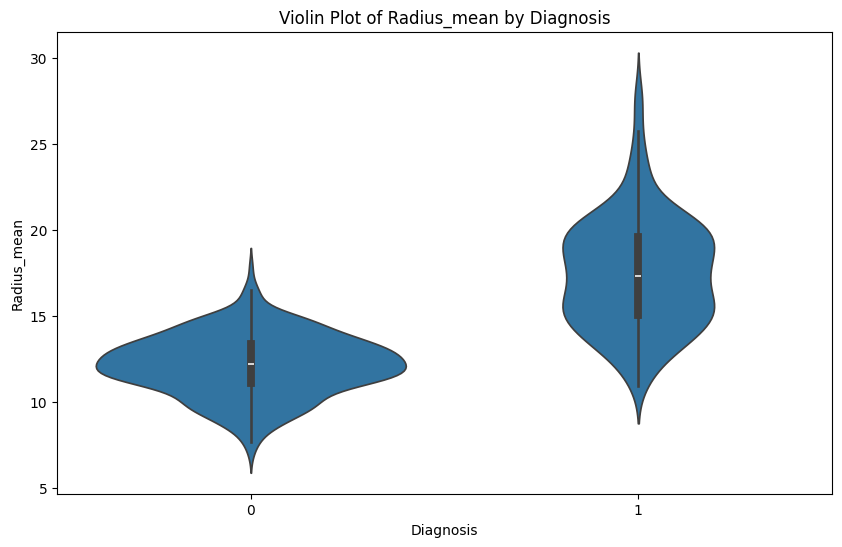

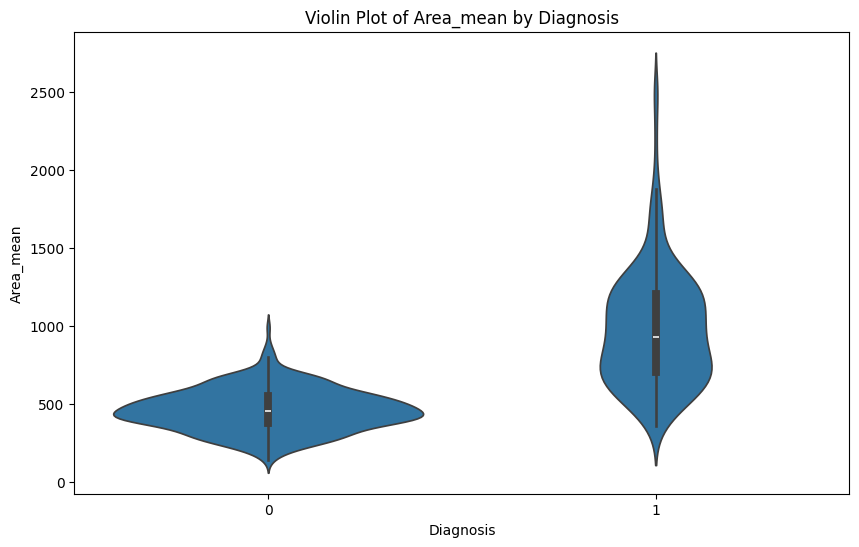

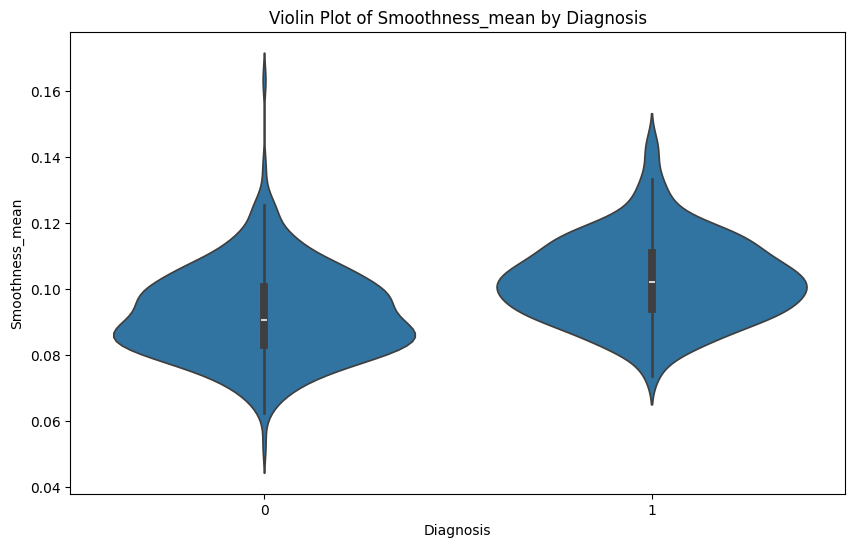

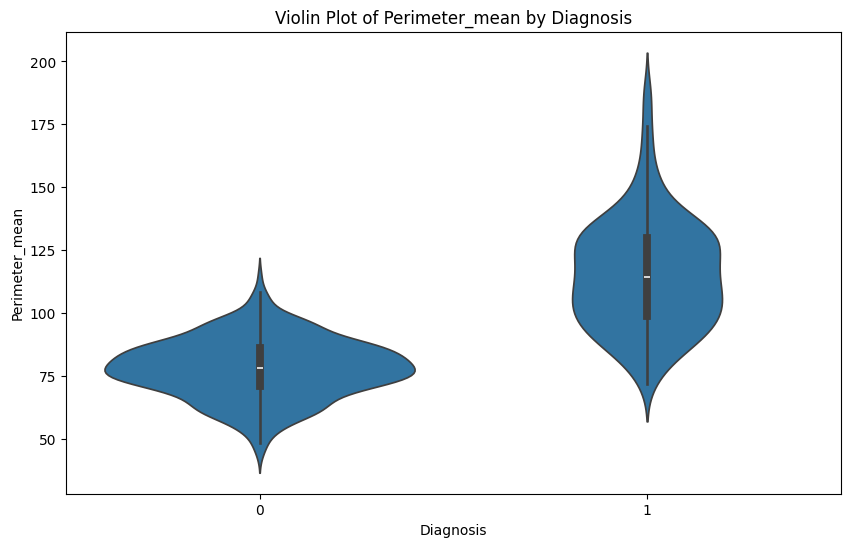

In [182]:
eda.violin_plot(['Radius_mean', 'Area_mean', 'Smoothness_mean', 'Perimeter_mean'])

## 4. Data Preprocessing:

In [231]:
# Scale the data using Standard Scaler
eda.scale_data()

Scaled data sample:
   Radius_mean  Texture_mean  Smoothness_mean  Compactness_mean  \
0     1.097064     -2.073335         1.568466          3.283515   
1     1.829821     -0.353632        -0.826962         -0.487072   
2     1.579888      0.456187         0.942210          1.052926   
3    -0.768909      0.253732         3.283553          3.402909   
4     1.750297     -1.151816         0.280372          0.539340   

   Symmetry_mean  Fractal_dimension_mean  Radius_se  Texture_se  \
0       2.217515                2.255747   2.489734   -0.565265   
1       0.001392               -0.868652   0.499255   -0.876244   
2       0.939685               -0.398008   1.228676   -0.780083   
3       2.867383                4.910919   0.326373   -0.110409   
4      -0.009560               -0.562450   1.270543   -0.790244   

   Smoothness_se  Compactness_se  Symmetry_se  Symmetry_worst  
0      -0.214002        1.316862     1.148757        2.750622  
1      -0.605351       -0.692926    -0.805450 

In [233]:
# Split the data into train and test
# We will use PCA to reduce the features first to 2 components
X_train, X_test, y_train, y_test = eda.split_data_with_pca(n_components=2, test_size=0.2, random_state=42)


In [216]:
# Check the dataset after scaling and reduction of dims
X_train

array([[ 9.50238392, -2.99738153,  1.1612891 ],
       [ 6.53126807,  2.95531415, -1.41438354],
       [ 0.44491071, -3.58253924,  0.85116851],
       ...,
       [-4.98447284,  0.89890951,  0.56255196],
       [ 0.60404177,  1.14447517, -1.98188377],
       [-3.31384151,  0.128595  ,  0.28643056]])

In [217]:
y_train

68     0
181    1
63     0
248    0
60     0
      ..
71     0
106    0
270    0
435    1
102    0
Name: Diagnosis, Length: 455, dtype: int64

## 5. Gaussian Naive Bayes

In [229]:

class CustomGaussianNaiveBayes:
    # Class for a custom implementation of NB
    def __init__(self):
        self.class_priors = {} # Priors
        self.means = {} # Mean of feats
        self.variances = {} # vars
        self.classes = None # Unique classes
    
    def fit(self, X, y):
        """
        fit the Gaussian NB model
        """
        # Get labels
        self.classes = np.unique(y)
        
        # For loop to calc priors, means, and vars
        for c in self.classes:
            # sub set the data
            X_c = X[y == c]
            
            # Calc prior
            self.class_priors[c] = X_c.shape[0] / X.shape[0]
            
            # Calc mean
            self.means[c] = np.mean(X_c, axis=0)
            
            # Calc variance
            self.variances[c] = np.var(X_c, axis=0)
    
    def _calculate_likelihood(self, X, mean, variance):
        """
        Calculate the likelihood
        """
        # Calc to get the exp
        exponent = np.exp(-(
                (X - mean) ** 2) / (2 * variance)
                          )
        
        # return the results
        return (1 / np.sqrt(2 * np.pi * variance)) * exponent
    
    def _calculate_posteriors(self, X):
        """
        Calculate the posterior
        """
        posteriors = []
        
        # For loop tp calculate the posterior
        for c in self.classes:
            
            # prior for the class via log
            prior = np.log(self.class_priors[c])
            
            # Likelihood for the class using sum
            likelihood = np.sum(
                np.log(
                    self._calculate_likelihood(X, self.means[c], self.variances[c])
                ), axis=1)
            
            # Calculate posterior
            posteriors.append(prior + likelihood)
        
        # return the posteriors
        return np.array(posteriors).T
    
    def predict(self, X):
        """
        Predict the labels for the input 
        """
        # calc post
        posteriors = self._calculate_posteriors(X)
        
        # Return highest prob class
        return self.classes[np.argmax(posteriors, axis=1)]
    
    def predict_proba(self, X):
        """
        Predict the probabilities for each class
        """
        # Calculate posteriors
        posteriors = self._calculate_posteriors(X)
        
        #return probas
        return np.exp(posteriors) / np.sum(np.exp(posteriors), axis=1, keepdims=True)


In [237]:
# Initialize and train the Gaussian Naive Bayes model
gnb = CustomGaussianNaiveBayes()

# fit the model
gnb.fit(X_train, y_train)

# Make predictions
y_pred = gnb.predict(X_test)

# Evaluate accuracy
accuracy = np.mean(y_pred == y_test)
print(f"Accuracy of Gaussian Naive Bayes: {accuracy * 100:.1f}%")

Accuracy of Gaussian Naive Bayes: 93.0%


In [238]:
# Calculate Accuracy, Recall, F1, precision
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.90      1.00      0.95        71
           1       1.00      0.81      0.90        43

    accuracy                           0.93       114
   macro avg       0.95      0.91      0.92       114
weighted avg       0.94      0.93      0.93       114


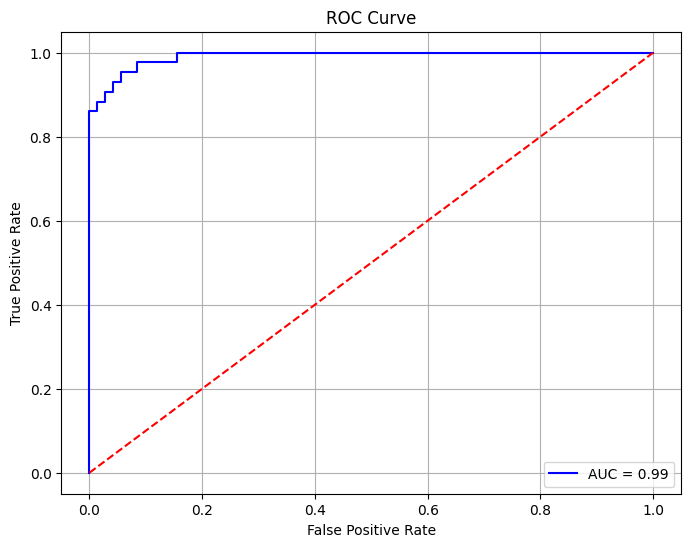

AUC Score: 0.99


In [239]:
# Predict the proba for y pred
y_pred_proba = gnb.predict_proba(X_test)[:, 1]

# Calculate ROC
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Calculate AUC
auc_score = roc_auc_score(y_test, y_pred_proba)

# Plot the results
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'AUC = {auc_score:.2f}')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Diagonal line (random guessing)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

# Display AUC score
print(f"AUC Score: {auc_score:.2f}")

## 6. Gaussian Discriminant Analysis

In [240]:

class CustomGaussianDiscriminantAnalysis:
    def __init__(self, shared_covariance=True):
        """
        init GDA model.
        """
        self.shared_covariance = shared_covariance
        self.class_priors = {} # Prior probs
        self.means = {} # Means
        self.covariance = None # Covariance matrix
        self.covariances = {} # Covariances per class
        self.classes = None # Unique classes
    
    def fit(self, X, y):
        """
        Fit GDA model to the training data
        """
        # class labels
        self.classes = np.unique(y)
        
        # num features
        n_features = X.shape[1]
        total_samples = X.shape[0]
        
        # account for share cov
        if self.shared_covariance:
            self.covariance = np.zeros((n_features, n_features))
        
        # loop over classes
        for c in self.classes:
            # Get Subset
            X_c = X[y == c]
            
            # calc prior
            self.class_priors[c] = X_c.shape[0] / total_samples
            
            # calc mean
            self.means[c] = np.mean(X_c, axis=0)
            
            # calc cov
            if self.shared_covariance:
                centered_X = X_c - self.means[c]
                self.covariance += centered_X.T @ centered_X
            else:
                # C-S Cov
                centered_X = X_c - self.means[c]
                self.covariances[c] = (centered_X.T @ centered_X) / X_c.shape[0]
        
        # Shared Cov
        if self.shared_covariance:
            self.covariance /= total_samples
    
    def _calculate_gaussian_density(self, X, mean, covariance):
        """
        Calculate the multivariate gaussian probability density
        """
        
        n_features = X.shape[1]
        centered_X = X - mean
        covariance_inv = np.linalg.inv(covariance)
        covariance_det = np.linalg.det(covariance)
        
        exponent = np.sum(centered_X @ covariance_inv * centered_X, axis=1)
        density = np.exp(-0.5 * exponent) / np.sqrt((2 * np.pi) ** n_features * covariance_det)
        
        return density
    
    def _calculate_posteriors(self, X):
        """
        Calculate the posterior proba
        """
        posteriors = []
        
        # Iterate and loop over each class, calc the posterior proba
        for c in self.classes:
            # Calculate prior
            prior = np.log(self.class_priors[c])
            
            # Calc likelihood
            if self.shared_covariance:
                # shared
                likelihood = np.log(self._calculate_gaussian_density(X, self.means[c], self.covariance))
            else:
                # not shared
                likelihood = np.log(self._calculate_gaussian_density(X, self.means[c], self.covariances[c]))
            
            # Posterior = Prior + Likelihood (in log space for numerical stability)
            posteriors.append(prior + likelihood)
        
        return np.array(posteriors).T
    
    def predict(self, X):
        """
        Predict the class labels for input 
        """
        # Calc posteriors
        posteriors = self._calculate_posteriors(X)
        
        # Return the class with the highest posterior
        return self.classes[np.argmax(posteriors, axis=1)]
    
    def predict_proba(self, X):
        """
        Predict the probabilities for class
        """
        posteriors = self._calculate_posteriors(X)
        return np.exp(posteriors) / np.sum(np.exp(posteriors), axis=1, keepdims=True)


In [243]:
# init and train model
gda = CustomGaussianDiscriminantAnalysis(shared_covariance=True)

# fit the model with training set
gda.fit(X_train, y_train)

# predict
y_pred = gda.predict(X_test)

# Calc accuracy
accuracy = np.mean(y_pred == y_test)
print(f"Accuracy of Gaussian Discriminant Analysis (Shared Covariance): {accuracy * 100:.2f}%")

Accuracy of Gaussian Discriminant Analysis (Shared Covariance): 93.86%


In [244]:
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.91      1.00      0.95        71
           1       1.00      0.84      0.91        43

    accuracy                           0.94       114
   macro avg       0.96      0.92      0.93       114
weighted avg       0.94      0.94      0.94       114


In [246]:
# Init without shared cov
gda_class_specific = CustomGaussianDiscriminantAnalysis(shared_covariance=False)
gda_class_specific.fit(X_train, y_train)

# calc predictions
y_pred_class_specific = gda_class_specific.predict(X_test)

# calc accuracy
accuracy_class_specific = np.mean(y_pred_class_specific == y_test)
print(f"Accuracy of Gaussian Discriminant Analysis (Class-Specific Covariance): {accuracy_class_specific * 100:.2f}%")


Accuracy of Gaussian Discriminant Analysis (Class-Specific Covariance): 94.74%


In [248]:
print(classification_report(y_test, y_pred_class_specific))


              precision    recall  f1-score   support

           0       0.93      0.99      0.96        71
           1       0.97      0.88      0.93        43

    accuracy                           0.95       114
   macro avg       0.95      0.93      0.94       114
weighted avg       0.95      0.95      0.95       114


## 7. Logistic Regression

In [249]:
class CustomLogisticRegressionGD:
    def __init__(self, learning_rate=0.01, iterations=1000):
        self.learning_rate = learning_rate
        self.iterations = iterations
        self.theta = None
    
    def sigmoid(self, z):
        # simple sigmoid calculation
        return 1 / (1 + np.exp(-z))
    
    def cost_function(self, h, y):
        # calcuate length of y
        m = len(y)
        # return calcualted cost function
        return (-1/m) * np.sum(y * np.log(h) + (1 - y) * np.log(1 - h))
    
    def fit(self, X, y):
        # Init weights
        m, n = X.shape
        self.theta = np.zeros(n)
        self.cost_history = []
        
        # iterate of the values
        for i in range(self.iterations):
            # calc the model prediction
            z = np.dot(X, self.theta)
            
            # calc sigmoid
            h = self.sigmoid(z)
            
            # calc gradient
            gradient = np.dot(X.T, (h - y)) / m
            # update weights
            self.theta -= self.learning_rate * gradient
            
            # calc cost for monitoring convergence
            cost = self.cost_function(h, y)
            # update
            self.cost_history.append(cost)
        
        return self

    def predict_prob(self, X):
        return self.sigmoid(np.dot(X, self.theta))

    def predict(self, X):
        return (self.predict_prob(X) >= 0.5).astype(int)

In [250]:

# Init and train Reg model using Gradient Descent
log_reg_gd = CustomLogisticRegressionGD(learning_rate=0.01, iterations=10000)
log_reg_gd.fit(X_train, y_train)

# Make prediction
y_pred_train = log_reg_gd.predict(X_train)
y_pred_test = log_reg_gd.predict(X_test)

# Calc accuracy, recall, f1, ROC-AUC of model
accuracy_train = accuracy_score(y_train, y_pred_train)
accuracy_test = accuracy_score(y_test, y_pred_test)
recall_test = recall_score(y_test, y_pred_test)
f1_test = f1_score(y_test, y_pred_test)
roc_auc_test = roc_auc_score(y_test, log_reg_gd.predict_prob(X_test))

In [254]:
print("accuracy_test: ", accuracy_test)

accuracy_test:  0.9473684210526315


In [252]:
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.99      0.93      0.96        71
           1       0.89      0.98      0.93        43

    accuracy                           0.95       114
   macro avg       0.94      0.95      0.94       114
weighted avg       0.95      0.95      0.95       114


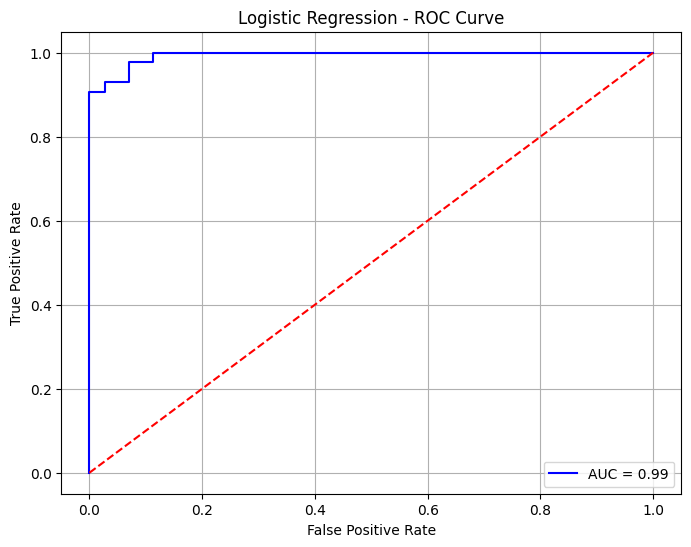

AUC Score for Logistic Regression: 0.99


In [253]:
# Init the LR model and fit
log_reg_gd = CustomLogisticRegressionGD(learning_rate=0.01, iterations=10000)
log_reg_gd.fit(X_train, y_train)

# predict probabilities
y_pred_proba_lr = log_reg_gd.predict_prob(X_test)

# ROC curve
fpr_lr, tpr_lr, thresholds_lr = roc_curve(y_test, y_pred_proba_lr)

# Calc AUC
auc_score_lr = roc_auc_score(y_test, y_pred_proba_lr)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_lr, tpr_lr, color='blue', label=f'AUC = {auc_score_lr:.2f}')
plt.plot([0, 1], [0, 1], color='red', linestyle='--') 
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Logistic Regression - ROC Curve')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

print(f"AUC Score for Logistic Regression: {auc_score_lr:.2f}")


## 8. Perceptron:

In [259]:
class CustomPerceptronModel:
    def __init__(self, learning_rate=0.01, iterations=1000):
        self.learning_rate = learning_rate
        self.iterations = iterations
        self.theta = None
    
    def fit(self, X, y):
        # Convert to np array
        y = np.array(y)
        
        # init weights 
        m, n = X.shape
        self.theta = np.zeros(n + 1)

        # add bias
        X = np.c_[np.ones((m, 1)), X]
        
        # train using the perceptron learning
        for _ in range(self.iterations):
            for i in range(m):
                # make pred
                linear_output = np.dot(X[i], self.theta)
                y_pred = 1 if linear_output >= 0 else 0

                # update weights
                self.theta += self.learning_rate * (y[i] - y_pred) * X[i]

    def predict(self, X):
        # Add bias 
        X = np.c_[np.ones((X.shape[0], 1)), X]
        # get dot
        linear_output = np.dot(X, self.theta)
        # return results
        return (linear_output >= 0).astype(int)

In [261]:
# Init and fit Perceptron 
perceptron = CustomPerceptronModel(learning_rate=0.01, iterations=2000)
perceptron.fit(X_train, y_train)

# predict
y_pred_train = perceptron.predict(X_train)
y_pred_test = perceptron.predict(X_test)

# evaluate
accuracy_train = accuracy_score(y_train, y_pred_train)
accuracy_test = accuracy_score(y_test, y_pred_test)
recall_test = recall_score(y_test, y_pred_test)
f1_test = f1_score(y_test, y_pred_test)

# Output metrics
results_perceptron = {
    "Training Accuracy": accuracy_train,
    "Test Accuracy": accuracy_test,
    "Test Recall": recall_test,
    "Test F1 Score": f1_test
}

results_perceptron

{'Training Accuracy': 0.9318681318681319,
 'Test Accuracy': 0.9473684210526315,
 'Test Recall': np.float64(0.9069767441860465),
 'Test F1 Score': np.float64(0.9285714285714286)}

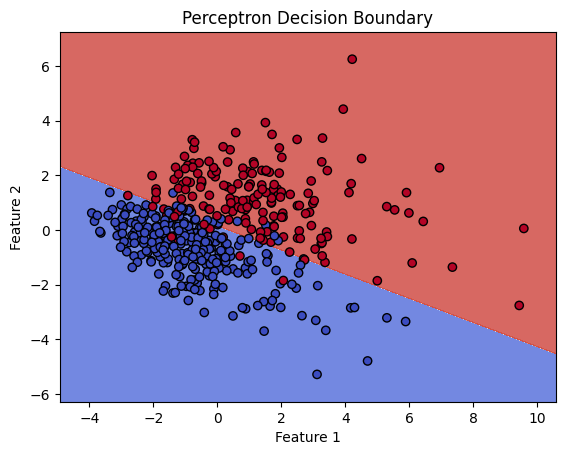

In [263]:
X_vis = X_train[:, :2]

def plot_perceptron_decision_boundary(X, y, model):
    # Plots the separation
    
    # get min and max for plot
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                         np.arange(y_min, y_max, 0.01))

    # pred the output
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    
    # plot decision boundary
    plt.contourf(xx, yy, Z, alpha=0.8, cmap='coolwarm')
    
    # generate plot
    plt.scatter(X[:, 0], X[:, 1], c=y, edgecolor='k', marker='o', cmap='coolwarm')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.title('Perceptron Decision Boundary')
    plt.show()

# invoke the function to see the boundary
plot_perceptron_decision_boundary(X_vis, y_train, perceptron)

## 9. Comparison Analysis:

In [266]:

def evaluate_model(model, X_train, X_test, y_train, y_test):
    # Function to evaluate model and return  metrics
    
    # git the model
    model.fit(X_train, y_train)
    
    # make predictions on testing
    y_pred_test = model.predict(X_test)
    
    # predict_proba conditional
    if hasattr(model, "predict_proba"):
        y_pred_proba_test = model.predict_proba(X_test)[:, 1]
        
        # calc roc auc
        roc_auc = roc_auc_score(y_test, y_pred_proba_test)
    else:
        roc_auc = "N/A"
    
    # calculate acc, pre, rec, f1
    accuracy = accuracy_score(y_test, y_pred_test)
    precision = precision_score(y_test, y_pred_test)
    recall = recall_score(y_test, y_pred_test)
    f1 = f1_score(y_test, y_pred_test)
    
    return accuracy, precision, recall, f1, roc_auc

# results
comparison_results = {}

# cusotm models
custom_models = {
    "Custom Gaussian Naive Bayes": CustomGaussianNaiveBayes(),
    "Custom Logistic Regression": CustomLogisticRegressionGD(learning_rate=0.01, iterations=5000),
    "Custom Perceptron": CustomPerceptronModel(learning_rate=0.01, iterations=1000),
    "Custom GDA (Shared Covariance)": CustomGaussianDiscriminantAnalysis(shared_covariance=True),
    "Custom GDA (Class-Specific Covariance)": CustomGaussianDiscriminantAnalysis(shared_covariance=False)
}

# run the custom models
for model_name, model in custom_models.items():
    accuracy, precision, recall, f1, roc_auc = evaluate_model(model, X_train, X_test, y_train, y_test)
    comparison_results[model_name] = {
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1,
        'ROC AUC': roc_auc
    }

# sklearn models
sklearn_models = {
    "Sklearn Gaussian Naive Bayes": GaussianNB(),
    "Sklearn Logistic Regression": LogisticRegression(max_iter=5000),
    "Sklearn Perceptron": Perceptron(max_iter=1000),
    "Sklearn Linear Discriminant Analysis": LinearDiscriminantAnalysis(),
    "Sklearn Quadratic Discriminant Analysis": QuadraticDiscriminantAnalysis()
}

# run models
for model_name, model in sklearn_models.items():
    accuracy, precision, recall, f1, roc_auc = evaluate_model(model, X_train, X_test, y_train, y_test)
    comparison_results[model_name] = {
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1,
        'ROC AUC': roc_auc
    }

# convert to DF
comparison_df = pd.DataFrame(comparison_results).T

# display
comparison_df

,Accuracy,Precision,Recall,F1 Score,ROC AUC
Custom Gaussian Naive Bayes,0.929825,1.0,0.813953,0.897436,0.991156
Custom Logistic Regression,0.947368,0.893617,0.976744,0.933333,N/A
Custom Perceptron,0.938596,0.891304,0.953488,0.921348,N/A
Custom GDA (Shared Covariance),0.938596,1.0,0.837209,0.911392,0.994104
Custom GDA (Class-Specific Covariance),0.947368,0.974359,0.883721,0.926829,0.994432
Sklearn Gaussian Naive Bayes,0.929825,1.0,0.813953,0.897436,0.991156
Sklearn Logistic Regression,0.95614,0.975,0.906977,0.939759,0.993449
Sklearn Perceptron,0.894737,0.860465,0.860465,0.860465,N/A
Sklearn Linear Discriminant Analysis,0.938596,1.0,0.837209,0.911392,0.994104
Sklearn Quadratic Discriminant Analysis,0.947368,0.974359,0.883721,0.926829,0.994432


### Compare Custom VS API

- Custom vs Sklearn LR:
  - Sklearn LR show that it mildly outperforms the custom version in terms of accuracy 95.6% and precision 97.5%
  - The custom model has higher recall 97.7%, showing it catches more positive cases but at the cost of reduced precision vs the API.

- Custom vs Sklearn GDA (Class-Specific):
  - Both models show nearly identical performance with accuracy = 94.7%, precision = 97.4% and recall = 88.4%) showing that the custom implementation closely follows API
  - This shows that the mathematical implementation in the custom model is accurate and consistent with the API

- Custom vs Sklearn Perceptron:
  - The API Perceptron performs worse with accuracy of 89.5% compared to the custom Perceptron with an accuracy 93.9%
  - The custom Perceptron achieves a higher recall as well with a valuue of 95.3%, which may indicate better sensitivity to positive cases vs API

- Custom vs Sklearn Gaussian Naive Bayes:
  - Both custom and API perform very closely accuracy about 92.98% and recall about 81.4%, showing that our Gaussian assumption holds well, and the custom model correctly contains the necessary calculations one would expect relative to API.

- Custom vs Sklearn GDA (Shared-Covariance):
  - Both models perform very similarly with accuracy around93.9%, showing that the shared covariance assumptions are equally well handled by both implementations.
  - This shows that the shared covariance calculation is correct in the custom model relative to the API

### Strengths and Weaknesses:

- Logistic Regression:
  - Strengths: Performs well on linearly separable data, provides probabilistic interpretation. Easily interpretable as a user.
  - Weaknesses: Struggles with non-linearly separable data, and custom implementation may suffer from slower convergence compared to Sklearn's highly optimized solver. I have used SKleans implementation in the past, and its very well optimized.

- Gaussian Naive Bayes:
  - Strengths: Simple and fast, works well with small datasets and when the independence assumption holds.Interpretable by users.
  - Weaknesses: The independence assumption may not hold for all features, leading to suboptimal performance. Custom implementation will take longer to converge than SKleans implemnetation.

- Gaussian Discriminant Analysis (GDA):
  - Strengths: Handles Gaussian distributed data well. THis is for both shared and class-specific covariance since versions work effectively.
  - Weaknesses: Can perform poorly if the data deviates significantly from the Gaussian assumption

- Perceptron:
  - Strengths: Simple and efficient when data is linearly separable. Mostly interpretable, but becomes less so with multilayer perceptron if we grew the model.
  - Weaknesses: Struggles with non-linearly separable data, and doesn't provide probabilistic outputs.

### Discussion of Linear Separability

- Separability: Linear separability can be visually checked by plotting the data in 2D. Purposefully used PCA to be able to see this better. I provided an image of this for the perceptron specifically.
  
- Perceptron Convergence: The Perceptron algorithm will converge if the data is linearly separable as we showed above. If the model does not converge or suffers from poor performance it tells us the data is not linearly separable

- Logistic Regression: Poor performance on Logistic Regression may indicate non-linear separability. THis is because it relies on a linear decision boundary.

- Sklearn Perceptron Lower Acc: The lower accuracy of Sklearn Perceptron compared to other models suggests that the dataset may not be perfectly linearly separable. THis is usually because the Perceptron assumes a linear boundary